In [56]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
%matplotlib inline

output_images_path = './output_images/'

In [57]:
#calibration

#calibration images 1, 4, 5 do not have the correct format
#skipped during calibration
 
camera_images = glob.glob('camera_cal/calibration*.jpg')

objpoints = []
imgpoints = []

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2)
nx, ny = 9, 6
gray_shape = None
for fname in camera_images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    if not gray_shape:
        gray_shape = gray.shape[::-1] #save gray shape for calibration later
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        
        #draw chessboard image
        #img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        #plt.imshow(img)
    else:
        print("Skip image " + fname)



Skip image camera_cal/calibration5.jpg
Skip image camera_cal/calibration4.jpg
Skip image camera_cal/calibration1.jpg


In [59]:
#util functions

region_vertices = np.array([
            [100, 539],
            [430, 330],
            [570, 330],
            [870, 539]
        ])

def plot_comparision_images(original, trans, fig_name='', title1='Original', title2='Processed', cmap1=None, cmap2=None):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 20))
    f.tight_layout()
    ax1.imshow(original, cmap=cmap1)
    ax1.set_title(title1, fontsize=50)
    ax2.imshow(trans, cmap=cmap2)
    ax2.set_title(title2, fontsize=50)
    if fig_name != '':
        f.savefig(output_images_path + fig_name)
        

In [60]:
#camera calibration
ret, mtx, dist, _, _ = cv2.calibrateCamera(objpoints, imgpoints, gray_shape, None, None)

def cal_undistort(img):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist


import pickle
# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "calibration_dist_pickle.p", "wb" ) )

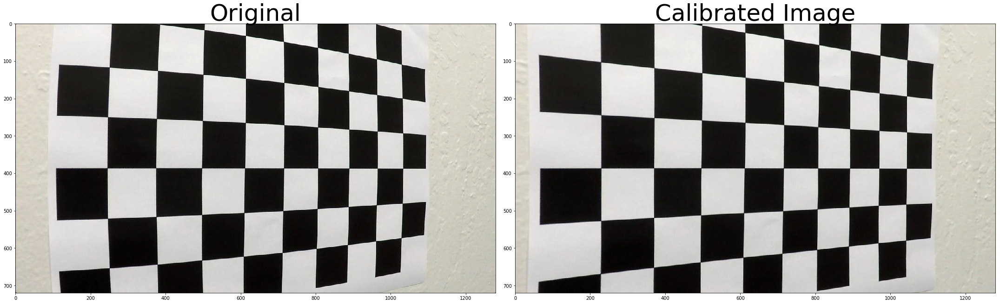

In [61]:
#camera calibration test 1
test_image = mpimg.imread(camera_images[2])
test_trans_image = cal_undistort(test_image)
plot_comparision_images(test_image, test_trans_image, 'camera_calibration_test1.jpg', title2='Calibrated Image')


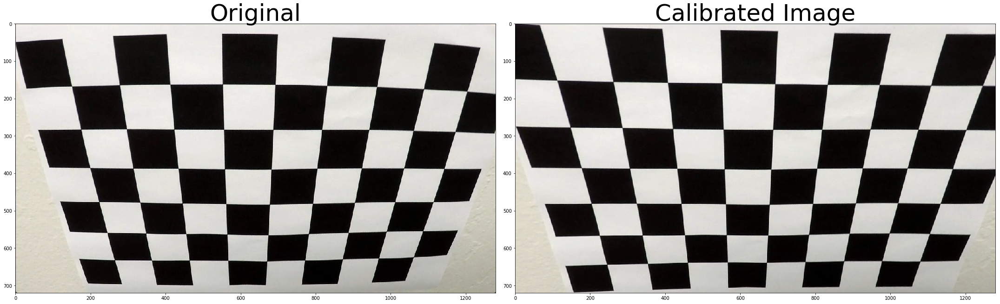

In [62]:
#camera calibration test 2
test_image = mpimg.imread(camera_images[6])
test_trans_image = cal_undistort(test_image)
plot_comparision_images(test_image, test_trans_image, 'camera_calibration_test2.jpg', title2='Calibrated Image')

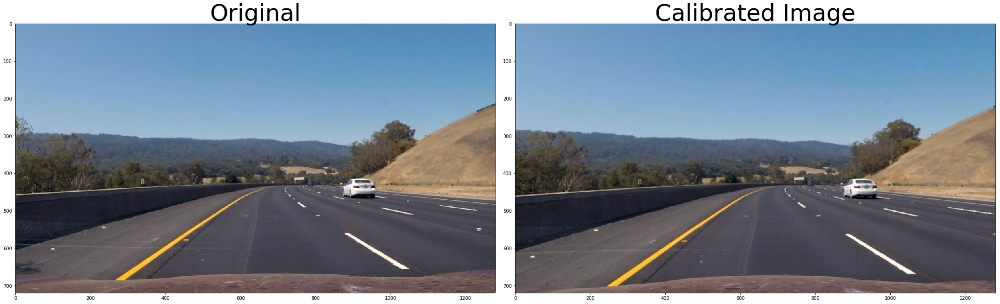

In [127]:
#camera calibration test 3
test_image = mpimg.imread('test_images/test3.jpg')
test_trans_image = cal_undistort(test_image)
plot_comparision_images(test_image, test_trans_image, 'camera_calibration_test3.jpg', title2='Calibrated Image')

In [63]:
#perspective transformation
# src and dst points were chosen based on the example image
def cal_warp(img):
    img_size = (img.shape[1], img.shape[0])
   
    src = np.float32(
        [[590,450],
         [685,450],
         [1120, img.shape[0]],
         [200, img.shape[0]]
        ])

    dst = np.float32(
        [[290,0],
         [1030,0],
         [1030, img.shape[0]],
         [290, img.shape[0]]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    #warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return M, Minv

p_image = mpimg.imread('test_images/straight_lines1.jpg')
M, Minv = cal_warp(p_image)

def get_warped_image(img):
    img_size = (img.shape[1], img.shape[0])
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped

def get_undistorded_warped(img):
    img = cal_undistort(img)
    img = get_warped_image(img)
    return img

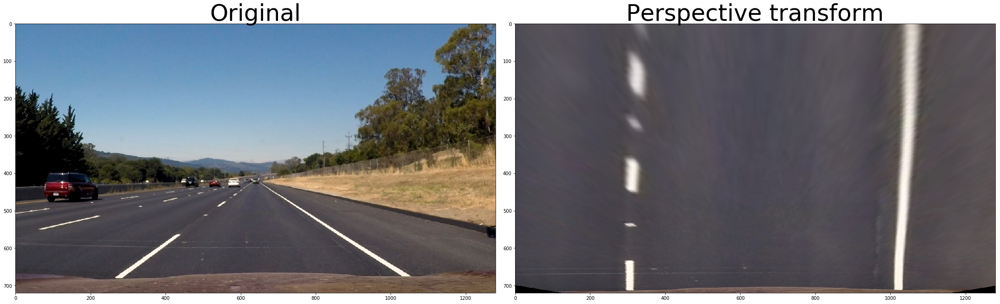

In [64]:
# test perspective transformation -1
test_image = mpimg.imread('test_images/straight_lines2.jpg')

test_warped = get_undistorded_warped(test_image)
plot_comparision_images(test_image, test_warped, fig_name='perspective_test1.jpg', title2='Perspective transform')


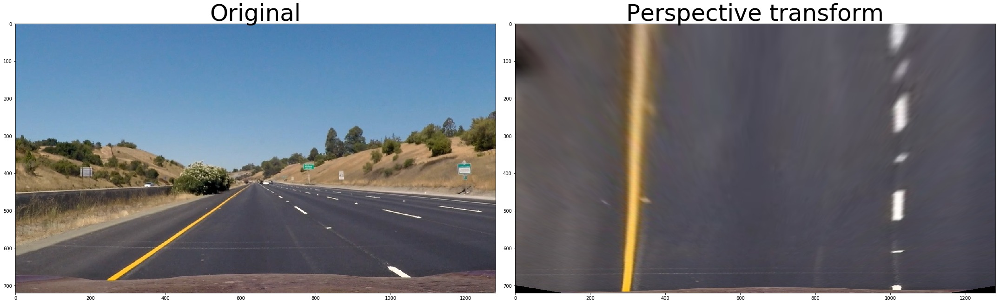

In [65]:
# test perspective transformation - 2
test_image = mpimg.imread('test_images/straight_lines1.jpg')

test_warped = get_undistorded_warped(test_image)
plot_comparision_images(test_image, test_warped, fig_name='perspective_test2.jpg', title2='Perspective transform')

In [66]:

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Convert to grayscale
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    else:
        gray = img
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

In [67]:
# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    else:
        gray = img
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

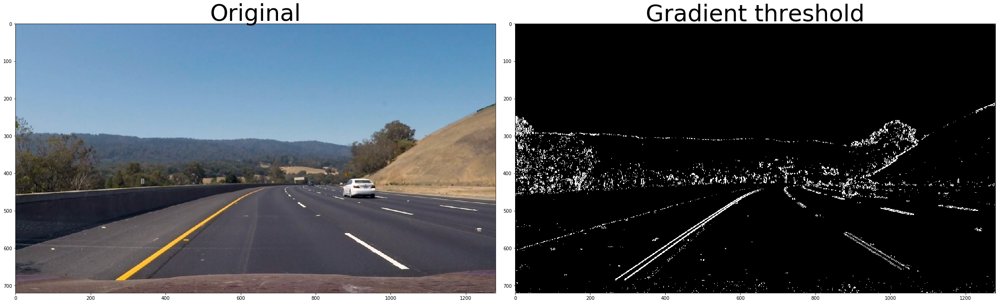

In [68]:
test_image = mpimg.imread('test_images/test3.jpg')

test_sobel = abs_sobel_thresh(test_image, thresh=(20, 100))
plot_comparision_images(test_image, test_sobel, fig_name='gradientx_thresh.jpg', title2='Gradient threshold', cmap2='gray')

In [69]:
# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(-np.pi/2, np.pi/2)):
    # Grayscale
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    else:
        gray = img
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

In [70]:
# Define a function that thresholds the *-channel of HLS
def hls_select(img, channel_name='S', thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    if channel_name == 'S':
        channel = hls[:, : , 2]
    elif channel_name == 'H':
        channel = hls[:, :, 0]
    else:
        channel = hls[:, :, 1]
        
    binary_output = np.zeros_like(channel)
    binary_output[(channel > thresh[0]) & (channel <= thresh[1])] = 1
    return binary_output


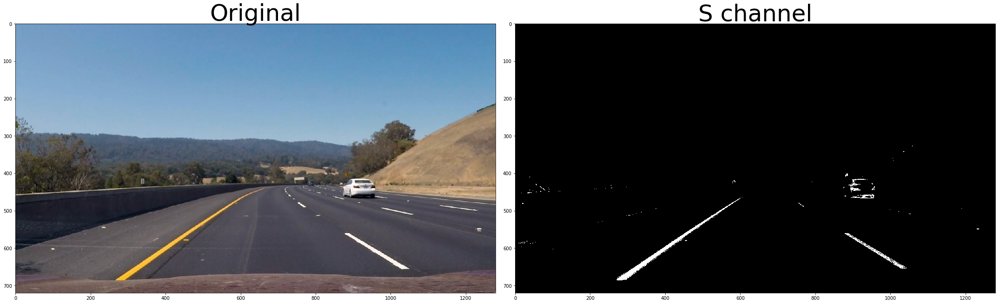

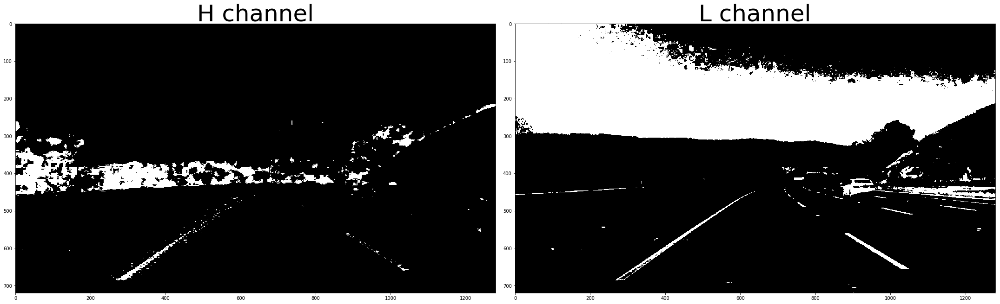

In [72]:
test_image = mpimg.imread('test_images/test3.jpg')
hls_S_thresh = hls_select(test_image, thresh=(150, 255))
plot_comparision_images(test_image, hls_S_thresh, fig_name='color_space_thresh1.jpg', title2='S channel', cmap2='gray')
hls_H_thresh = hls_select(test_image, channel_name='H', thresh=(20, 100))
hls_L_thresh = hls_select(test_image, channel_name='L', thresh=(150, 255))
plot_comparision_images(hls_H_thresh, hls_L_thresh, fig_name='color_space_thresh2.jpg', title1='H channel',
                        title2='L channel', cmap1='gray', cmap2='gray')

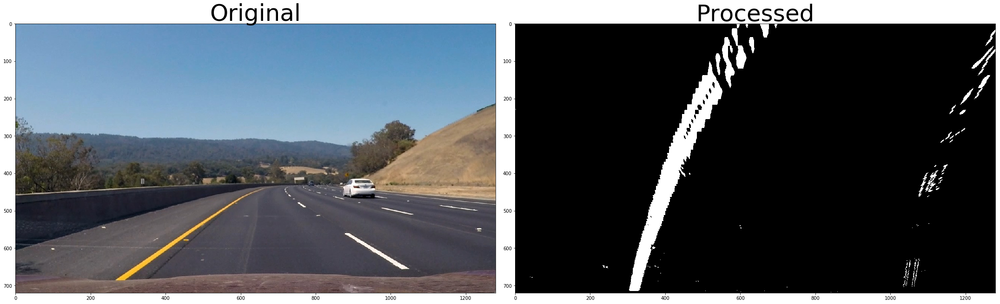

In [120]:
# apply distortaion correction, color and gradient thresholding and warping
# the output image is ready to be processed for lane line detection

def get_threshold_warpped_image(image):
    
    image = cal_undistort(image)
    gradx = abs_sobel_thresh(image, orient='x', thresh=(20,100))
    mag = mag_thresh(image, mag_thresh=(30, 130))
    direction = dir_threshold(image, thresh=(0.7, 1.2))
    hls_s = hls_select(image, thresh=(170, 255))
    hls_l = hls_select(image, channel_name='L', thresh=(100, 200))
    combine = np.zeros_like(hls_s)
    combine[ ((gradx == 1) & (direction == 1) & (mag == 1) ) | ((hls_s == 1) & (hls_l == 1)) ] = 1
    warpped = get_warped_image(combine)
    return warpped

#test above combined function
test_image = mpimg.imread('test_images/test3.jpg')

output = get_threshold_warpped_image(test_image)
plot_comparision_images(test_image, output, fig_name='undist_thresh_warpped.jpg', cmap2='gray')

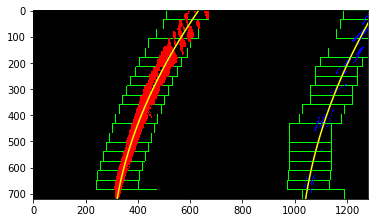

In [121]:
#fine lane lines using histogram technique
def hist(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # Sum across image pixels vertically - make sure to set an `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram

def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = hist(binary_warped)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    offset = (leftx_base + rightx_base) / 2 - midpoint
    
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 20
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, offset, out_img 


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, offset, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    return left_fitx, right_fitx, ploty, offset, out_img


#testing sliding window and poly fit
test_image = mpimg.imread('test_images/test3.jpg')
binary_warpped = get_threshold_warpped_image(test_image)
left_fitx, right_fitx, ploty, offset, out_img = fit_polynomial(binary_warpped)

plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.imshow(out_img)

In [122]:
#measure lane curvature

def measure_curvature_pixels(ploty, left_fit, right_fit, offset=0):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fit*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fit*xm_per_pix, 2)
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    offset = offset * xm_per_pix
    return left_curverad, right_curverad, offset

def add_info_to_image(img, left_curverad, right_curverad, offset):
    curvature = (left_curverad + right_curverad) / 2
    font = cv2.FONT_HERSHEY_SIMPLEX
    color = (200,255,155)
    cv2.putText(img, 'Radius of Curvature = %d(m)' % curvature, (70, 70), font, 2.2, color, 13)
    left_or_right = "left" if offset < 0 else "right"
    cv2.putText(img, 'Vehicle is %.2fm %s of center' % (np.abs(offset), left_or_right), (70, 200), font, 2.2,
        color, 13)
    return img

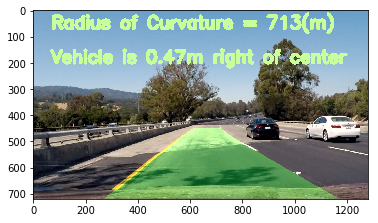

In [123]:
# Create an image to draw the lines on
def draw(warped, orig_image, ploty, left_fitx, right_fitx):
    global Minv
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (orig_image.shape[1], orig_image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(orig_image, 1, newwarp, 0.3, 0)
    return result


#testing sliding window and poly fit
test_image = mpimg.imread('test_images/test4.jpg')
binary_warpped = get_threshold_warpped_image(test_image)
left_fitx, right_fitx, ploty, offset, _ = fit_polynomial(binary_warpped)
left_curverad, right_curverad, offset = measure_curvature_pixels(ploty, left_fitx, right_fitx, offset)
out_img = draw(binary_warpped, test_image, ploty, left_fitx, right_fitx)
out_img = add_info_to_image(out_img, left_curverad, right_curverad, offset)

plt.imshow(out_img)

In [124]:
#image pipeline, process every frame from  video
def image_pipeline(img):
    global prev_left_cr, prev_right_cr
    original_image = np.copy(img)
    binary_warpped = get_threshold_warpped_image(img)
    left_fitx, right_fitx, ploty, offset, _ = fit_polynomial(binary_warpped)
   
    left_curverad, right_curverad, offset = measure_curvature_pixels(ploty, left_fitx, right_fitx, offset)
    out_img = draw(binary_warpped, original_image, ploty, left_fitx, right_fitx)
    out_img = add_info_to_image(out_img, left_curverad, right_curverad, offset)
    prev_left_fitx = left_fitx
    prev_right_fitx = right_fitx
    return out_img
    

In [125]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

clip = VideoFileClip("project_video.mp4").subclip(37, 45)
clip_annotated = clip.fl_image(image_pipeline)
%time clip_annotated.write_videofile("project_video_hard.mp4", audio=False)

[MoviePy] >>>> Building video project_video_hard.mp4
[MoviePy] Writing video project_video_hard.mp4


100%|█████████▉| 200/201 [00:37<00:00,  5.36it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_hard.mp4 

CPU times: user 2min 52s, sys: 3.32 s, total: 2min 55s
Wall time: 38.2 s


In [126]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

clip = VideoFileClip("project_video.mp4")
clip_annotated = clip.fl_image(image_pipeline)
%time clip_annotated.write_videofile("project_video_out.mp4", audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████▉| 1260/1261 [03:37<00:00,  5.78it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

CPU times: user 16min 50s, sys: 18.4 s, total: 17min 8s
Wall time: 3min 38s
